<a href="https://colab.research.google.com/github/AhmedFahim-git/Coursera_Capstone/blob/main/The_Battle_of_Neighborhoods_IBM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Battle of Neighborhoods: Best location for new coffee shop in Toronto

## 1. Introduction

### 1.1. Background

Coffee is the most popular adult beverage in Canada. Canadians love their coffee more than beer, wine, soda, and even tap water! According to a study, men consumed on average about 3 cups of coffee a day, while women consumed about 2.4 cups. Coffee is mostly consumed at home, and the most common time for a cup of coffee in Canada is around breakfast. When it comes to coffee taken outside of the home, the majority of Canadians prefer to do so at a restaurant or at work. Nevertheless, coffee shops are still very popular in Canada, with two of three Canadians visiting Coffee shops at least once a month.

Despite all this popularity, the location of a coffee shop still plays great impact on its success (or failure). An article by [startmycoffeeshop](https://startmycoffeeshop.com/20-tips-to-find-the-best-location-for-your-coffee-shop-business/), gives a great introduction to anyone choosing a spot for a new coffee shop. According to the article, there are a number of factors to watch out for when choosing location for setting up a new coffee shop. The number and type of businesses were deemed as particularly important. So for anyone looking to start a new coffee shop in the Toronto area, it would be a good idea if we could segment the place, and spot the desirable areas.

### 1.2. Problem

The analysis proposed only requires data on the businesses that operate in the Toronto area. The article mentions dozens of pointers in choosing location for coffee shop; however, the main ones are summarized below:

1.   Most of the coffee shop business is taken by popular chain stores like Tim Horton's and Starbucks. So for new coffee shops, it should be as far as possible from these chain stores.
2.   The main clientele for coffee shops consists of office workers picking up a coffee on their way to work. Hence, coffee shops should try to place themselves as close as possible to business centers and offices



## 2. Data acquisition and Cleaning

### 2.1. Data source

First and foremost we need a map of the Toronto area. This was obtained from the [Toronto Open Data Portal](https://open.toronto.ca/dataset/neighbourhoods/). After this we need to get the businesses and their locations using the Foursquare API. But before we can do that we need to cover the Toronto area with a grid to span the whole area without missing anything.  This was done using the python h3 library using a cell area resolution of 8, which covered the whole Toronto area with hexagonal grids with a side length of a little less than 500 meters. The cell resolution was selected such that limit on the number of results returned by the API call was never reached, ensuring that our list is complete. And then we used the Foursquare API centered at the centroids of each of the hexagons to locate the businesses.

Finally we used geopy Nominatim to convert our desirable location coordinates into actual addresses.

### 2.2. Data Cleaning

The data obtained from the Toronto Open Data Portal had many columns but only area name, area code and geometry (i.e. the polygons, or shapes, that define the outline of the neighborhoods in Toronto) columns were chosen. The other columns were irrelevant for our analysis.

The data returned by the Foursquare API also had many irrelevant information that was also removed. The data that remained include the name of the business, latitude, longitude and the category of business. As we wanted our list to be complete, in many places there were overlaps in our search which resulted in duplicate entries which were later removed. Moreover, some of the names had characters like ‘ and ` which caused difficulty in printing and displaying the results. These characters were removed from the names.

#### Imports

We start by making the imports as necessary.

In [2]:
import pandas as pd
import numpy as np
!pip install geopandas
import geopandas as gpd

!pip install -U folium
import folium
from folium.plugins import HeatMap, MarkerCluster
import shapely
import branca.colormap as cm
import seaborn as sns
import matplotlib.pyplot as plt

!pip install h3
from h3 import h3

from geopy.distance import geodesic, great_circle
from geopy.geocoders import Nominatim

!pip install yellowbrick -U
from sklearn.preprocessing import minmax_scale

import requests

     |████████████████████████████████| 1.0MB 4.0MB/s 
     |████████████████████████████████| 6.6MB 23.0MB/s 
     |████████████████████████████████| 15.4MB 178kB/s 
     |████████████████████████████████| 102kB 3.2MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.12.1 which is incompatible.
  Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
     |████████████████████████████████| 798kB 4.0MB/s 
     |████████████████████████████████| 276kB 4.0MB/s 
  Found existing installation: yellowbrick 0.9.1
    Uninstalling yellowbrick-0.9.1:
      Successfully uninstalled yellowbrick-0.9.1


#### Toronto Neighborhood geographic data

Then we get the Toronto Neighborhood data from the [Toronto Open Data Portal](https://open.toronto.ca/dataset/neighbourhoods/).

In [4]:
df = gpd.read_file('https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=2019')

df.head()

,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,CLASSIFICATION,CLASSIFICATION_CODE,geometry
0,11481,2480141,26005521,None,96,96,Casa Loma (96),Casa Loma (96),None,None,None,None,17545105,3.678385e+06,8214.176485,None,None,"POLYGON ((311679.007 4836894.754, 311666.369 4..."
1,11482,2480140,26005520,None,95,95,Annex (95),Annex (95),None,None,None,None,17545121,5.337192e+06,10513.883143,None,None,"POLYGON ((313337.005 4836320.072, 313197.193 4..."
2,11483,2480139,26005519,None,109,109,Caledonia-Fairbank (109),Caledonia-Fairbank (109),None,None,None,None,17545137,2.955857e+06,6849.911724,None,None,"POLYGON ((308008.191 4837741.636, 307989.638 4..."
3,11484,2480064,26005444,None,64,64,Woodbine Corridor (64),Woodbine Corridor (64),None,None,None,None,17545153,3.052518e+06,7512.966773,None,None,"POLYGON ((319731.911 4836111.264, 319590.745 4..."
4,11485,2480063,26005443,None,103,103,Lawrence Park South (103),Lawrence Park South (103),None,None,None,None,17545169,6.211341e+06,13530.370002,None,None,"POLYGON ((311976.621 4840247.041, 311921.210 4..."


We extract the names of the neighobrhoods from the column AREA_NAME. And we only keep the columns Neighborhood, Area_Code, and geometry

In [5]:
neighborhood_shp = df[['AREA_NAME','AREA_SHORT_CODE','geometry']]
neighborhood_shp.loc[:'AREA_NAME'].replace(' \(\d+\)$', '', regex=True,inplace=True)

neighborhood_shp.columns = ['Neighborhood','Area_Code','geometry']
neighborhood_shp

,Neighborhood,Area_Code,geometry
0,Casa Loma,96,"POLYGON ((311679.007 4836894.754, 311666.369 4..."
1,Annex,95,"POLYGON ((313337.005 4836320.072, 313197.193 4..."
2,Caledonia-Fairbank,109,"POLYGON ((308008.191 4837741.636, 307989.638 4..."
3,Woodbine Corridor,64,"POLYGON ((319731.911 4836111.264, 319590.745 4..."
4,Lawrence Park South,103,"POLYGON ((311976.621 4840247.041, 311921.210 4..."
...,...,...,...
135,Dorset Park,126,"POLYGON ((321350.016 4847889.727, 321417.071 4..."
136,Centennial Scarborough,133,"POLYGON ((333373.623 4847224.433, 333376.310 4..."
137,Humbermede,22,"POLYGON ((302683.013 4843833.960, 302666.333 4..."
138,Willowdale West,37,"POLYGON ((309596.175 4846834.464, 309589.033 4..."


#### Make grid

We use the h3 module to make a hexagonal grid over the Toronto area. The Foursquare API allows us to return only 100 results per API call. Moreover, we need make sure that we are taking into account all the venues of interest; so we must never cross or even  reach our limit of 100 results.

We used an area resolution of 8 because it corresponds to hexagons of side length about 500 m. And from trial and error we found that this size of grid spanned the area and at the same time ensuring that the limit of 100 results is never exceeded.

In [6]:
def make_grid(area_res=8):
    hexs = h3.polyfill(neighborhood_shp.dissolve()['geometry'].buffer(3300).to_crs('EPSG:4326')[0].__geo_interface__, area_res, geo_json_conformant = True)
    polygonise = lambda hex_id: shapely.geometry.Polygon( h3.h3_to_geo_boundary( hex_id, geo_json=True) )

    grid = gpd.GeoDataFrame({'geometry':list(map(polygonise, hexs))}, index=hexs, crs="EPSG:4326" )
    grid = grid.to_crs(epsg=2019).reset_index(drop=True)
    grid = grid.loc[grid.intersects(neighborhood_shp.dissolve().iloc[np.full(grid.shape[0], 0)], align=False), :]
    grid.reset_index(drop=True, inplace=True)

    grid[['lng','lat']] = grid.centroid.to_crs('EPSG:4326').map(lambda point: '{},{}'.format(point.x, point.y)).str.split(pat=',', expand=True)
    grid['lng'] = pd.to_numeric(grid['lng'])
    grid['lat'] = pd.to_numeric(grid['lat'])
    return grid

grid = make_grid(8)
grid

,geometry,lng,lat
0,"POLYGON ((304218.761 4848939.225, 303682.321 4...",-79.508756,43.777654
1,"POLYGON ((304471.270 4837342.010, 303935.125 4...",-79.505608,43.673269
2,"POLYGON ((309956.937 4839426.508, 309420.679 4...",-79.437564,43.692015
3,"POLYGON ((326758.048 4855511.453, 326221.199 4...",-79.228504,43.836487
4,"POLYGON ((312679.503 4844595.707, 312143.083 4...",-79.403718,43.738519
...,...,...,...
914,"POLYGON ((320605.178 4852743.964, 320068.464 4...",-79.305091,43.811734
915,"POLYGON ((325676.924 4842548.740, 325140.416 4...",-79.242447,43.719845
916,"POLYGON ((330759.649 4851325.128, 330222.864 4...",-79.178949,43.798678
917,"POLYGON ((304515.978 4829096.108, 303980.044 4...",-79.505047,43.599048


#### Using Foursquare API

Now we use the Foursquare API to get locations of coffee shops and offices. First we define the credentials, and then we make a function to extract the relevant venues and their locations.

We also keep an assertion in place to warn us if our API result limit of 100 has been reached or not. In case the limit is reached, we need to use smaller grid size to ensure that the limit is not reached.

In [ ]:
client_id = ''
client_secret = ''
version = '20210101'
limit = 100

coffee_shop_id = '4bf58dd8d48988d1e0931735'
office_id = '4bf58dd8d48988d124941735'

In [ ]:
def getNearbyVenues(latitudes, longitudes,category, radius=500):
    
    venues_list=[]
    for lat, lng in zip( latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lng, category, radius, limit)
            
        # make the GET request
        response = requests.get(url).json()

        results = response["response"]['groups'][0]['items']

        # print('{} venues found'.format(len(results)))

        assert len(results) < limit, 'Limit reached, increase the limit or use smaller area'
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
        

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = [
                  'Venue_name', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now we search for all the coffee shops in the Toronto area using the Foursquare API and the coffee shop category ID.

We also store the results obtained because it requires a lot of API calls and we wouldn't want to repeat it once it's done.

In [ ]:
coffee_shops = getNearbyVenues(grid['lat'], grid['lng'],coffee_shop_id)
coffee_shops.rename(columns={'Venue_name':'Coffee_shop_name'}, inplace=True)
coffee_shops.drop_duplicates(inplace=True,ignore_index=True)
coffee_shops['Coffee_shop_name'] = coffee_shops['Coffee_shop_name'].str.replace(r"['`]",'')
coffee_shops.to_csv('coffee_shops.csv', index=False)
coffee_shops

,Coffee_shop_name,Venue Latitude,Venue Longitude,Venue Category
0,Boxcar Social,43.638319,-79.382463,Café
1,Lavazza Espression,43.639537,-79.381763,Coffee Shop
2,World Café at Harbourfront Centre,43.638347,-79.383046,Café
3,Tim Hortons,43.638725,-79.386340,Coffee Shop
4,Mos Mos,43.641640,-79.377552,Coffee Shop
...,...,...,...,...
1738,Starbucks,43.758015,-79.409613,Coffee Shop
1739,Oliva,43.758343,-79.409880,Coffee Shop
1740,Commisso Bakery,43.748678,-79.517262,Tea Room
1741,Tim Hortons,43.595607,-79.515690,Coffee Shop


And after that we search for all the offices in the Toronto area using the Foursquare API and the offices category ID.

In [ ]:
offices = getNearbyVenues(grid['lat'], grid['lng'],office_id)
offices.rename(columns={'Venue_name':'Office_name'}, inplace=True)
offices.drop_duplicates(inplace=True,ignore_index=True)
offices['Office_name'] = offices['Office_name'].str.replace(r"['`]",'')
offices.to_csv('offices.csv', index=False)
offices

,Office_name,Venue Latitude,Venue Longitude,Venue Category
0,Queens Quay Terminal,43.638318,-79.380413,Office
1,Labatt Breweries of Canada,43.638282,-79.380378,Brewery
2,Sympatico.ca,43.639890,-79.381212,Office
3,J3 Canada,43.639817,-79.381189,Office
4,DHX Media,43.638279,-79.380318,Office
...,...,...,...,...
2900,Global,43.776200,-79.481200,Office
2901,Stortz Toys,43.772663,-79.479580,Office
2902,Canada Turkish Community,43.775653,-79.479694,Office
2903,ITRenew,43.773011,-79.479256,Office


## 3. Methodology

### 3.1. Exploratory Data analysis

Having obtained the required data our first step is to visualize the data to spot any obvious trends and relationships. As most of the data is geographical it makes sense to first of all visualize the geographical distribution of the data. We will be using the python library folium for this purpose.

#### Coffee shop map

First, we try to visualize the coffee shop data. We start by assigning each coffee shop to its respective neighborhood.

In [8]:
coffee_shops_2 = coffee_shops.copy()
coffee_shops_2['geometry'] = gpd.GeoSeries(coffee_shops_2.apply(lambda x:shapely.geometry.Point(x['Venue Longitude'], x['Venue Latitude']), axis=1))
coffee_shops_2 = gpd.GeoDataFrame(coffee_shops_2).set_crs(epsg=4326)

df = neighborhood_shp.to_crs(epsg=4326)
for i in range(neighborhood_shp.shape[0]):
  coffee_bool = coffee_shops_2.intersects(df.iloc[np.full(coffee_shops_2.shape[0], i)], align=False)
  coffee_shops_2.loc[coffee_bool,'Neighborhood'] = neighborhood_shp.iloc[i,0]
  coffee_shops_2.loc[coffee_bool,'Area_Code'] = neighborhood_shp.iloc[i,1]

coffee_shops_2.dropna(inplace=True)
coffee_shops_2['Area_Code'] = coffee_shops_2['Area_Code'].astype('int')
coffee_shops_2

,Coffee_shop_name,Venue Latitude,Venue Longitude,Venue Category,geometry,Neighborhood,Area_Code
0,Boxcar Social,43.638319,-79.382463,Café,POINT (-79.38246 43.63832),Waterfront Communities-The Island,77
1,Lavazza Espression,43.639537,-79.381763,Coffee Shop,POINT (-79.38176 43.63954),Waterfront Communities-The Island,77
2,World Café at Harbourfront Centre,43.638347,-79.383046,Café,POINT (-79.38305 43.63835),Waterfront Communities-The Island,77
3,Tim Hortons,43.638725,-79.386340,Coffee Shop,POINT (-79.38634 43.63872),Waterfront Communities-The Island,77
4,Mos Mos,43.641640,-79.377552,Coffee Shop,POINT (-79.37755 43.64164),Waterfront Communities-The Island,77
...,...,...,...,...,...,...,...
1738,Starbucks,43.758015,-79.409613,Coffee Shop,POINT (-79.40961 43.75802),Willowdale East,51
1739,Oliva,43.758343,-79.409880,Coffee Shop,POINT (-79.40988 43.75834),Willowdale East,51
1740,Commisso Bakery,43.748678,-79.517262,Tea Room,POINT (-79.51726 43.74868),Glenfield-Jane Heights,25
1741,Tim Hortons,43.595607,-79.515690,Coffee Shop,POINT (-79.51569 43.59561),New Toronto,18


Then we aggregate the coffee shop by count to find out the number of coffee shops in each neighborhood. This will be needed to make the choropleth map.

In [9]:
coffee_count = coffee_shops_2.loc[:,['Coffee_shop_name','Area_Code']].groupby('Area_Code').agg(number_of_coffee_shops=('Coffee_shop_name','count'))
coffee_count = coffee_count.merge(neighborhood_shp[['Neighborhood','Area_Code','geometry']], left_index=True, right_on='Area_Code',how='outer')
coffee_count.fillna(0, inplace=True)
coffee_count['number_of_coffee_shops'] = coffee_count['number_of_coffee_shops'].astype('int')
coffee_count = gpd.GeoDataFrame(coffee_count)
coffee_count

,number_of_coffee_shops,Neighborhood,Area_Code,geometry
24,38,West Humber-Clairville,1,"POLYGON ((300580.507 4840842.925, 300578.633 4..."
34,2,Mount Olive-Silverstone-Jamestown,2,"POLYGON ((296475.144 4846222.860, 296582.181 4..."
124,2,Thistletown-Beaumond Heights,3,"POLYGON ((298555.553 4843551.457, 298512.123 4..."
122,4,Rexdale-Kipling,4,"POLYGON ((300358.554 4841468.883, 300364.648 4..."
8,7,Kingsview Village-The Westway,6,"POLYGON ((300580.507 4840842.925, 300586.164 4..."
...,...,...,...,...
49,3,Eglinton East,138,"POLYGON ((325303.842 4843221.012, 325260.977 4..."
30,5,Scarborough Village,139,"POLYGON ((327844.809 4842802.715, 327841.997 4..."
32,3,Guildwood,140,"POLYGON ((328052.026 4845510.599, 328055.175 4..."
10,0,Pleasant View,46,"POLYGON ((317397.968 4850373.959, 317387.059 4..."


We used a choropleth map to show the number of coffee shops in each neighborhood, and on top of that we used marker clusters to show the individual coffee shops.

In [ ]:
lng,lat=list(neighborhood_shp.dissolve().centroid.to_crs('EPSG:4326')[0].coords)[0]
m = folium.Map(location=[lat, lng], zoom_start=11)

choropleth = folium.Choropleth(
    geo_data=coffee_count,
    data=coffee_count,
    columns=["Area_Code", "number_of_coffee_shops"],
    key_on='feature.properties.Area_Code',
    name="choropleth",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Number of Coffee shops",
    highlight=True
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Neighborhood','Area_Code','number_of_coffee_shops'])
)

MarkerCluster(
    locations= coffee_shops_2.loc[:,['Venue Latitude','Venue Longitude']].to_numpy(),
    popups = coffee_shops_2.loc[:,'Coffee_shop_name'].tolist()
    ).add_to(m)

m.save("coffee_shop_map.html")
m

The figure above shows that most of the neighborhoods in Toronto have very few, if any, coffee shops. However, some on the other hand has over a hundred. The top two neighborhoods for coffee shops are Waterfront Communities – The island and Bay Street Corridor. Both of these neighborhoods are quite densely populated with lots of businesses.

#### Office map

Now, we try to visualize the offices data. Again we start by assigning each office to its respective neighborhood.

In [ ]:
offices_2 = offices.copy()
offices_2['geometry'] = gpd.GeoSeries(offices_2.apply(lambda x:shapely.geometry.Point(x['Venue Longitude'], x['Venue Latitude']), axis=1))
offices_2 = gpd.GeoDataFrame(offices_2).set_crs(epsg=4326)

df = neighborhood_shp.to_crs(epsg=4326)
for i in range(neighborhood_shp.shape[0]):
  offices_bool = offices_2.intersects(df.iloc[np.full(offices_2.shape[0], i)], align=False)
  offices_2.loc[offices_bool,'Neighborhood'] = neighborhood_shp.iloc[i,0]
  offices_2.loc[offices_bool,'Area_Code'] = neighborhood_shp.iloc[i,1]

offices_2.dropna(inplace=True)
offices_2['Area_Code'] = offices_2['Area_Code'].astype('int')
offices_2

,Office_name,Venue Latitude,Venue Longitude,Venue Category,geometry,Neighborhood,Area_Code
0,Queen's Quay Terminal,43.638318,-79.380413,Office,POINT (-79.38041 43.63832),Waterfront Communities-The Island,77
1,Labatt Breweries of Canada,43.638282,-79.380378,Brewery,POINT (-79.38038 43.63828),Waterfront Communities-The Island,77
2,Sympatico.ca,43.639890,-79.381212,Office,POINT (-79.38121 43.63989),Waterfront Communities-The Island,77
3,J3 Canada,43.639817,-79.381189,Office,POINT (-79.38119 43.63982),Waterfront Communities-The Island,77
4,DHX Media,43.638279,-79.380318,Office,POINT (-79.38032 43.63828),Waterfront Communities-The Island,77
...,...,...,...,...,...,...,...
3009,Global,43.776200,-79.481200,Office,POINT (-79.48120 43.77620),York University Heights,27
3010,Stortz Toys,43.772663,-79.479580,Office,POINT (-79.47958 43.77266),York University Heights,27
3011,Canada Turkish Community,43.775653,-79.479694,Office,POINT (-79.47969 43.77565),York University Heights,27
3012,ITRenew,43.773011,-79.479256,Office,POINT (-79.47926 43.77301),York University Heights,27


Then we aggregate the offices by count to find out the number of offices in each neighborhood. This will be needed to make the choropleth map.

In [ ]:
office_count = offices_2.loc[:,['Office_name','Area_Code']].groupby('Area_Code').agg(number_of_offices=('Office_name','count'))
office_count = office_count.merge(neighborhood_shp[['Neighborhood','Area_Code','geometry']], left_index=True, right_on='Area_Code',how='outer')
office_count.fillna(0, inplace=True)
office_count['number_of_offices'] = office_count['number_of_offices'].astype('int')
office_count = gpd.GeoDataFrame(office_count)
office_count

,number_of_offices,Neighborhood,Area_Code,geometry
24,132,West Humber-Clairville,1,"POLYGON ((300580.507 4840842.925, 300578.633 4..."
34,6,Mount Olive-Silverstone-Jamestown,2,"POLYGON ((296475.144 4846222.860, 296582.181 4..."
124,5,Thistletown-Beaumond Heights,3,"POLYGON ((298555.553 4843551.457, 298512.123 4..."
122,4,Rexdale-Kipling,4,"POLYGON ((300358.554 4841468.883, 300364.648 4..."
48,1,Elms-Old Rexdale,5,"POLYGON ((300358.554 4841468.883, 300312.577 4..."
...,...,...,...,...
80,40,Woburn,137,"POLYGON ((328052.026 4845510.599, 328046.253 4..."
49,3,Eglinton East,138,"POLYGON ((325303.842 4843221.012, 325260.977 4..."
30,2,Scarborough Village,139,"POLYGON ((327844.809 4842802.715, 327841.997 4..."
32,1,Guildwood,140,"POLYGON ((328052.026 4845510.599, 328055.175 4..."


We used a similar visualization for offices, i.e. a choropleth map to show the neighborhood level distribution and with marker clusters on top to show individual offices.

In [ ]:
lng,lat=list(neighborhood_shp.dissolve().centroid.to_crs('EPSG:4326')[0].coords)[0]
m = folium.Map(location=[lat, lng], zoom_start=11)

choropleth = folium.Choropleth(
    geo_data=office_count,
    data=office_count,
    columns=["Area_Code", "number_of_offices"],
    key_on='feature.properties.Area_Code',
    name="choropleth",
    fill_color="YlGn",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Number of Offices",
    highlight=True
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Neighborhood','Area_Code','number_of_offices'])
)

MarkerCluster(
    locations= offices_2.loc[:,['Venue Latitude','Venue Longitude']].to_numpy(),
    popups = offices_2.loc[:,'Office_name'].tolist()
    ).add_to(m)

m.save("office_map.html")
m

Once again, this shows that most neighborhood has very few offices, which would explain the lack of coffee shops for most of the Toronto area. We also notice that the top two neighborhoods for coffee shops are also the top two neighborhoods for offices.

#### Identifying Chain Coffee Shops

Next we need to identify the chain coffee stores, because it is needed for the analysis proposed by the article.

We start by looking at the brands that have the most number of coffee shops in the Toronto area.

In [10]:
print('Total number of coffee shops in Toronto is {}.'.format(coffee_shops_2.shape[0]))
print()
for index, value in coffee_shops_2['Coffee_shop_name'].value_counts().loc[coffee_shops_2['Coffee_shop_name'].value_counts()>3].iteritems():
    print('{} has {} coffee shops in Toronto.'.format(index, value))


Total number of coffee shops in Toronto is 1698.

Tim Hortons has 344 coffee shops in Toronto.
Starbucks has 224 coffee shops in Toronto.
Second Cup has 80 coffee shops in Toronto.
Country Style has 41 coffee shops in Toronto.
Coffee Time has 38 coffee shops in Toronto.
Aroma Espresso Bar has 32 coffee shops in Toronto.
Timothys World Coffee has 27 coffee shops in Toronto.
La Prep has 15 coffee shops in Toronto.
Jimmys Coffee has 6 coffee shops in Toronto.
Dark Horse Espresso Bar has 6 coffee shops in Toronto.
Balzacs Coffee has 6 coffee shops in Toronto.
Tim Hortons / Esso has 6 coffee shops in Toronto.
Pilot Coffee Roasters has 6 coffee shops in Toronto.
Delimark Cafe has 5 coffee shops in Toronto.
Wallace Espresso has 4 coffee shops in Toronto.
DAVIDsTEA has 4 coffee shops in Toronto.
Coffee time has 4 coffee shops in Toronto.
Java Joes has 4 coffee shops in Toronto.
Sam James Coffee Bar has 4 coffee shops in Toronto.


We draw pie chart and bar charts to identify the threshold value for determining the number of coffee shops it must have in Toronto in order to consider it as a chain coffee shop for our analysis.

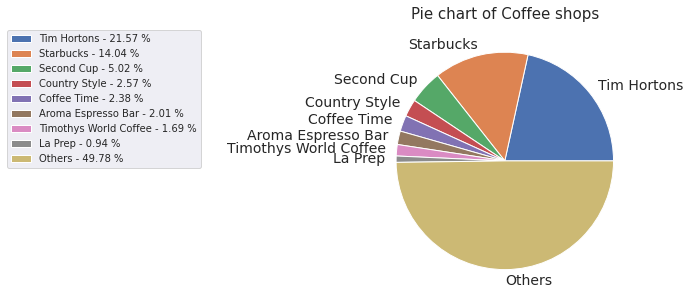

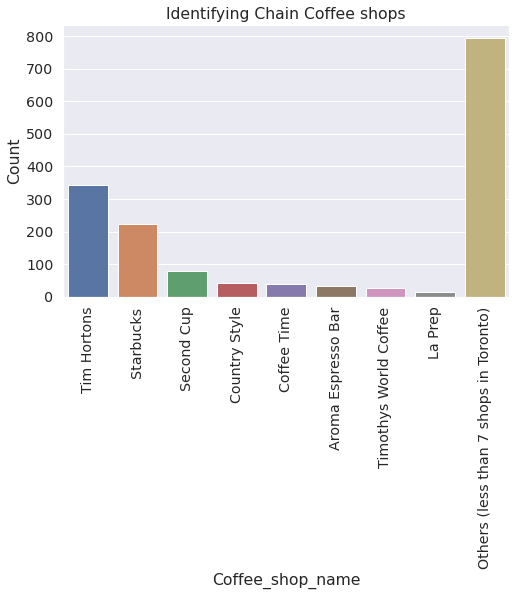

In [13]:
df = coffee_shops_2['Coffee_shop_name'].value_counts()
Others = (df<=6).sum()
df = df.loc[df>6]
df = df.append(pd.Series(Others, index=['Others (less than 7 shops in Toronto)']))

df = df.to_frame()
df.reset_index(inplace=True)
df.columns = ['Coffee_shop_name','Count']


# Pie chart
plt.figure(figsize=(8,5))
porcent = 100.*df['Count']/df['Count'].sum()
x=df['Count']
y = df['Coffee_shop_name'].replace({'Others (less than 7 shops in Toronto)':'Others'})

patches, texts = plt.pie(x=x, labels=y, textprops={'fontsize': 14});
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(y, porcent)]

sort_legend = False
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='best', bbox_to_anchor=(-0.6, 1.),
           fontsize=10);

plt.title('Pie chart of Coffee shops', fontsize=15);
plt.savefig('piechart.png', bbox_inches='tight');

# Bar Chart
sns.set_theme(font_scale=1.3)
plt.figure(figsize=(8,5))
sns.barplot(data=df, x='Coffee_shop_name',y='Count');
plt.title('Identifying Chain Coffee shops')
plt.xticks(rotation=90);
plt.savefig('Identifying chain coffee shop.png',bbox_inches = 'tight')
sns.set_theme(font_scale=1)

From the list and pie chart above we can see that a number of coffee shops make up a large portion of the market. Tim Horton's, which is the most popular coffee shop in Canada, make up over 20 % of coffee shops; Starbucks is second with just below 14% of the market.

We also see that many coffee shops have 6 or fewer coffee shops in the area. Hence, this is taken as the cutoff point to determine chain stores. That is, coffee shops that have more than 6 stores in the Toronto area are taken as chain coffee stops that must be avoided. The chain coffee shops make up over 50 % of the market.

### 3.2. Scoring, Clustering, and Heat map

Now that we’ve done our preliminary analysis, its time to spot some favorable locations. To accomplish this we will cover the entire area with a grid and find locations on the grid that are desirable for setting up coffee shops. And in order to quantify the desirability of location we will assign it a score. The choice of which scoring function to use was somewhat arbitrary, but it should follow our intuitions and the guidelines given in the article.

The score is calculated using the distances to nearby businesses; only those that are within 500 meters from the center of our grid are considered ‘nearby businesses’. We calculate the inverse of the distance to the nearby businesses and scale it by factor depending on the type of business. For example chain coffee shops are scaled by a factor of -1.9; regular coffee shops are scaled by a factor -0.6; and finally offices are scaled by a factor of +1.5. The sum of all these weightings make up the score for a particular location. The scores for all locations are then scaled so that it lies in the interval 0 to 1.

In [7]:
coffee_shops = pd.read_csv('/content/coffee_shops.csv')
offices = pd.read_csv('/content/offices.csv')

#### Scoring

Here we defined the scoring function and applied it to grid having a higher resolution than the one before. The choice of a higher resolution grid was so that clusters show up more readily.

In [ ]:
blacklist = coffee_shops['Coffee_shop_name'].value_counts()[coffee_shops['Coffee_shop_name'].value_counts()>6].index
def get_score(my_row):
    my_loc = (my_row['lat'],my_row['lng'])
    score = 0
    coffee_temp = coffee_shops.copy(deep=True)
    coffee_temp['distance']= coffee_temp.apply(lambda x: great_circle(my_loc, (x['Venue Latitude'], x['Venue Longitude'])).meters ,axis=1)
    coffee_temp = coffee_temp.loc[coffee_temp['distance']<500,:]
    score -= 1.3*(1/coffee_temp.loc[((coffee_temp['distance']<250) & (coffee_temp['Coffee_shop_name'].isin(blacklist))),'distance']).sum()
    score -= 0.6 * (1/coffee_temp['distance']).sum()

    office_temp = offices.copy(deep=True)
    office_temp['distance']= office_temp.apply(lambda x: great_circle(my_loc, (x['Venue Latitude'], x['Venue Longitude'])).meters ,axis=1)
    office_temp = office_temp.loc[office_temp['distance']<500,:]
    score += 1.5 * (1/office_temp['distance']).sum()
    return score

In [ ]:
new_grid = make_grid(9)
data = new_grid[['lat','lng']]
data['weight'] = data.apply(get_score, axis=1)
data.loc[:,'weight'] = data.loc[:,['weight',]].apply(minmax_scale)
data

,lat,lng,weight
0,43.681946,-79.348842,0.400576
1,43.819509,-79.195970,0.380363
2,43.774145,-79.368069,0.519767
3,43.653143,-79.591704,0.380363
4,43.714044,-79.285120,0.383265
...,...,...,...
6019,43.696691,-79.486470,0.380490
6020,43.784629,-79.413388,0.397592
6021,43.644852,-79.329226,0.380363
6022,43.780653,-79.467888,0.401810


The scoring takes a really long time and so it might be a good idea to store the results for further analysis.

In [ ]:
import pickle

with open('data.pickle','wb') as file:
  pickle.dump(data, file)

In [ ]:
with open('/content/data.pickle','rb') as file:
  data = pickle.load(file)

#### Clustering

Now that all the grid points have been scored, we now cluster them based on the score using KMeans. We used the yellowbrick module to determine the optimum number of clusters to use for the analysis.

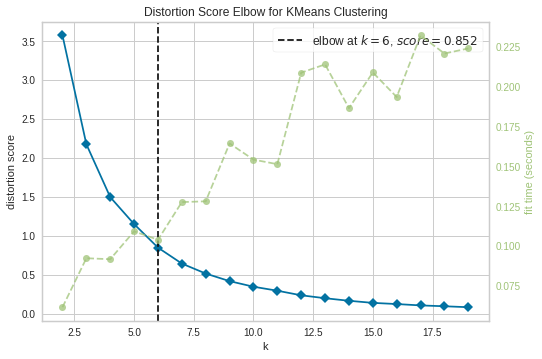

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=0)
visualizer = KElbowVisualizer(model, k=(2,20))


visualizer.fit(data.loc[:,['weight']])        # Fit the data to the visualizer
visualizer.show(outpath="yellowbrickkmeans.png");      # Finalize and render the figure

The optimum number of clusters was found to be 6. So now we apply this to our data to get the final clustering results. We used a a box plot to determine the clusters to show in the heatmap.

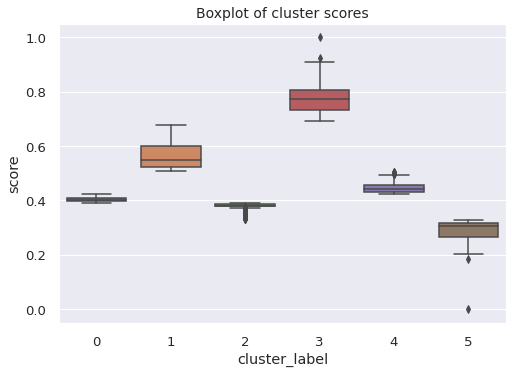

In [ ]:
# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(data.loc[:,['weight']])

data['cluster_label'] = kmeans.labels_

sns.set_theme(font_scale=1.2)
sns.boxplot(data=data, x='cluster_label', y='weight');
plt.ylabel('score')
plt.title('Boxplot of cluster scores', fontsize=14);
plt.savefig('cluster_boxplot.png', bbox_inches='tight');
sns.set_theme(font_scale=1)

Based on the boxplot shown above the clusters labeled 1 and 3 looks promising, hence we are going to visualize those two clusters in the heatmap.

In [ ]:
lng,lat=list(neighborhood_shp.dissolve().centroid.to_crs('EPSG:4326')[0].coords)[0]
m = folium.Map(location=[lat, lng], zoom_start=11)

choropleth = folium.Choropleth(
    geo_data=neighborhood_shp,
    name="choropleth",
    fill_color="YlGn",
    fill_opacity=0,
    line_opacity=0.5,
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['Neighborhood','Area_Code'])
)


HeatMap(data.loc[data['cluster_label'].isin([1,3]),['lat','lng','weight']].to_numpy(), radius=5,blur=2).add_to(m)

m.save("cluster_heatmap.html")
m

The map above shows that the best spot for a new coffee shop is located within the hub of offices and other coffee shops.

### 4. Results

The analysis revealed locations that might be good for new coffee shops. The best locations are given below.

In [ ]:
geolocator = Nominatim(user_agent="my_app")

for i, row in data.nlargest(5, 'weight').reset_index().iterrows():
  
  location = geolocator.reverse((row['lat'], row['lng']))
  print('The no. {} location for coffee shop with a score of {:.2f} out of 1 is:'.format(i+1, row['weight']))
  print(location.address[:-44])
  print()


The no. 1 location for coffee shop with a score of 1.00 out of 1 is:
Hudson's Bay Centre, Park Road, Yorkville, University—Rosedale, Old Toronto, Toronto

The no. 2 location for coffee shop with a score of 0.93 out of 1 is:
RBC Waterpark Place III, 85, Harbour Street, Harbourfront, Spadina—Fort York, Old Toronto, Toronto

The no. 3 location for coffee shop with a score of 0.91 out of 1 is:
Jacobs & Co. Steakhouse, Brant Street, Fashion District, Spadina—Fort York, Old Toronto, Toronto

The no. 4 location for coffee shop with a score of 0.89 out of 1 is:
72, Fraser Avenue, Little Tibet, Spadina—Fort York, Old Toronto, Toronto

The no. 5 location for coffee shop with a score of 0.82 out of 1 is:
Joey & Toby Tanenbaum Opera Centre, Nicholson Lane, St. Lawrence, Toronto Centre, Old Toronto, Toronto



### 5. Discussion

The analysis is contingent on a number of key assumptions which are given below:

*   The guidelines given in the article by [startmycoffeeshop](https://startmycoffeeshop.com/20-tips-to-find-the-best-location-for-your-coffee-shop-business/) are correct.
*   The truncated version of guidelines used in this analysis was reasonably correct.
*   The scoring function used to score the grid points was appropriate.

Of these assumptions, the first one is most likely to be met. The second one should also be reasonably met. The third point however, is open to discussion. Nevertheless, I tried a number of scoring function having various functional forms, but they all seemed to point towards roughly the same locations. Hence, I also believe that my analysis was correct.

### 6. Conclusion

In this study I analyzed the Toronto area in search for suitable spots for a new coffee shop. Bulk of the data was obtained using the Foursquare API. And the method of finding the best location for coffee shop was taken from the web article by [startmycoffeeshop](https://startmycoffeeshop.com/20-tips-to-find-the-best-location-for-your-coffee-shop-business/). I then transformed the main points from the article into a set of scoring criteria, which I evaluated for each point in the hexagonal grid that spanned the entire area. This resulted in a grid with a score assigned to each point that denoted the desirability of the location for a new coffee shop. Finally I clustered the points and plotted the high scoring grid points onto a heat map.